# train

In [1]:
import yaml
import os

with open("./config.yaml", 'rb') as f:
    config = yaml.load(f)

<ipython-input-1-1499ab5789c7>:5: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  config = yaml.load(f)


In [2]:
OUTPUT_ROOT = config['IO_OPTION']['OUTPUT_ROOT']
os.makedirs(OUTPUT_ROOT, exist_ok=True)

## load library

In [3]:
# python default library
import os
import shutil
import datetime
import sys
import pickle

# general analysis tool-kit
import numpy as np
import pandas as pd
#from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

# pytorch
import torch
from torch import optim, nn
from torch.utils.tensorboard import SummaryWriter
import timm
import torch_optimizer
#from torchvision.models import wide_resnet50_2, resnet18
#from torchsummary import summary

# etc
import yaml
yaml.warnings({'YAMLLoadWarning': False})

# original library
sys.path.append('/home/hiroki/research/dcase2021_task2/src/functions')
import common as com
import pytorch_modeler as modeler
from pytorch_model import ResNet38 as Model
#from pytorch_utils import filtered_load_model
#import models

import librosa
import IPython
import librosa.display

In [4]:
#model = timm.create_model('efficientnet_b1', pretrained=True)
#3, 320, 320
#name: (channel_multiplier, depth_multiplier, resolution, dropout_rate)
#(1.4, 1.8, 380, 0.4)

In [5]:
#model.blocks[0][0]

## load config and set logger

In [6]:
log_folder = config['IO_OPTION']['OUTPUT_ROOT']+'/{0}.log'.format(datetime.date.today())
logger = com.setup_logger(log_folder, '00_train.py')

## Setting

In [7]:
# Setting seed
modeler.set_seed(42)

In [8]:
############################################################################
# Setting I/O path
############################################################################
# input dirs
INPUT_ROOT = config['IO_OPTION']['INPUT_ROOT']
dev_dir = INPUT_ROOT + "/dev_data"
add_dev_dir = INPUT_ROOT + "/add_dev_data"
# machine type
machine_types = os.listdir(dev_dir)
# output dirs
OUTPUT_ROOT = config['IO_OPTION']['OUTPUT_ROOT']
MODEL_DIR = config['IO_OPTION']['OUTPUT_ROOT'] + '/models'
TB_DIR = config['IO_OPTION']['OUTPUT_ROOT'] + '/tb'
OUT_FEATURE_DIR = OUTPUT_ROOT + '/extraction_features'
#os.makedirs(OUTPUT_ROOT, exist_ok=True)
os.makedirs(MODEL_DIR, exist_ok=True)
os.makedirs(TB_DIR, exist_ok=True)
os.makedirs(OUT_FEATURE_DIR, exist_ok=True)
# copy config
shutil.copy('./config.yaml', OUTPUT_ROOT)

'/media/hiroki/HDD1TB/research/DCASE_experiments/domain_adaptation/exp2/config.yaml'

In [9]:
torch.cuda.is_available()

True

## make path list

- __train_paths__ ([dict]): Each Machine Type
    - __ToyCar__ ([dict]): Each dataset
        - train ([list]) : paths
        - valid_source ([list]) : paths
        - valid_target ([list]) :paths
    - __ToyTrain__ ([dict]): Each dataset
        - train ([list]) : paths
        - valid_source ([list]) : paths
        - valid_target ([list]) : paths
    - ...

In [10]:
dev_paths = {}

for machine_type in machine_types:
    # dev train
    dev_train_paths = [f"{dev_dir}/{machine_type}/train/" + file for file in os.listdir(f"{dev_dir}/{machine_type}/train")]
    dev_train_paths = sorted(dev_train_paths)
    
    print(f'Machine {machine_type}', end=',')
    print(f'dev_train_size : {len(dev_train_paths)}', end=', ')
    dev_train_source_paths = [path for path in dev_train_paths if 'source' in path]
    print(f'source_size : {len(dev_train_source_paths)}', end=', ')
    dev_train_target_paths = [path for path in dev_train_paths if 'target' in path]
    print(f'target_size : {len(dev_train_target_paths)}', end=', ')
    # source mode
    dev_train_paths = dev_train_source_paths + dev_train_target_paths
    
    # add_dev train
    add_dev_paths = [f"{add_dev_dir}/{machine_type}/train/" + file for file in os.listdir(f"{add_dev_dir}/{machine_type}/train")]
    add_dev_paths = sorted(add_dev_paths)
    print(f'adddev_train_size : {len(dev_train_paths)}', end=', ')
    add_dev_source_paths = [path for path in add_dev_paths if 'source' in path]
    print(f'source_size : {len(add_dev_source_paths)}', end=', ')
    add_dev_target_paths = [path for path in add_dev_paths if 'target' in path]
    print(f'target_size : {len(add_dev_target_paths)}')
    # source mode
    add_dev_paths = add_dev_source_paths + add_dev_target_paths
    print('==============================================================')
    
    # dev_source valid
    dev_source_paths = [f"{dev_dir}/{machine_type}/source_test/" + file for file in os.listdir(f"{dev_dir}/{machine_type}/source_test")]
    dev_source_paths = sorted(dev_source_paths)
    
    # dev_target valid
    dev_target_paths = [f"{dev_dir}/{machine_type}/target_test/" + file for file in os.listdir(f"{dev_dir}/{machine_type}/target_test")]
    dev_target_paths = sorted(dev_target_paths)
    
    # bundle
    dev_paths[machine_type] = {}
    dev_paths[machine_type]['train'] = dev_train_paths + add_dev_paths
    dev_paths[machine_type]['valid_source'] = dev_source_paths
    dev_paths[machine_type]['valid_target'] = dev_target_paths

Machine fan,dev_train_size : 3009, source_size : 3000, target_size : 9, adddev_train_size : 3009, source_size : 3000, target_size : 9
Machine gearbox,dev_train_size : 3026, source_size : 3017, target_size : 9, adddev_train_size : 3026, source_size : 3105, target_size : 9
Machine pump,dev_train_size : 3009, source_size : 3000, target_size : 9, adddev_train_size : 3009, source_size : 3000, target_size : 9
Machine slider,dev_train_size : 3009, source_size : 3000, target_size : 9, adddev_train_size : 3009, source_size : 3000, target_size : 9
Machine ToyCar,dev_train_size : 3009, source_size : 3000, target_size : 9, adddev_train_size : 3009, source_size : 3000, target_size : 9
Machine ToyTrain,dev_train_size : 3009, source_size : 3000, target_size : 9, adddev_train_size : 3009, source_size : 3000, target_size : 9
Machine valve,dev_train_size : 3009, source_size : 3000, target_size : 9, adddev_train_size : 3009, source_size : 3000, target_size : 9


In [11]:
machine_types

['fan', 'gearbox', 'pump', 'slider', 'ToyCar', 'ToyTrain', 'valve']

In [12]:
machine_types

['fan', 'gearbox', 'pump', 'slider', 'ToyCar', 'ToyTrain', 'valve']

In [13]:
feat = pd.read_pickle(f'{OUT_FEATURE_DIR}/{machine_types[0]}_features.pkl')

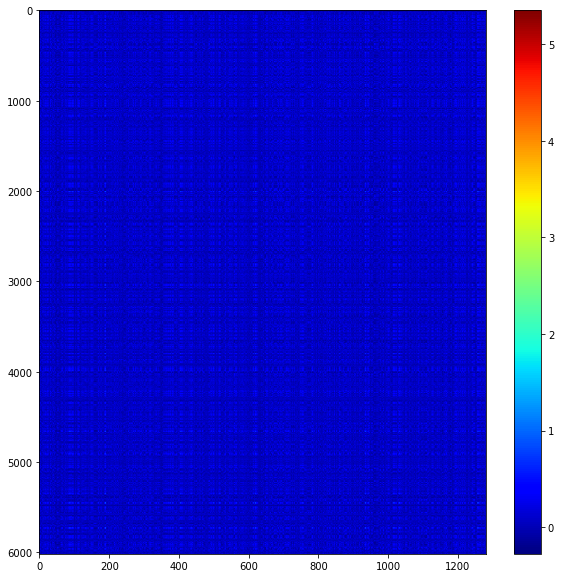

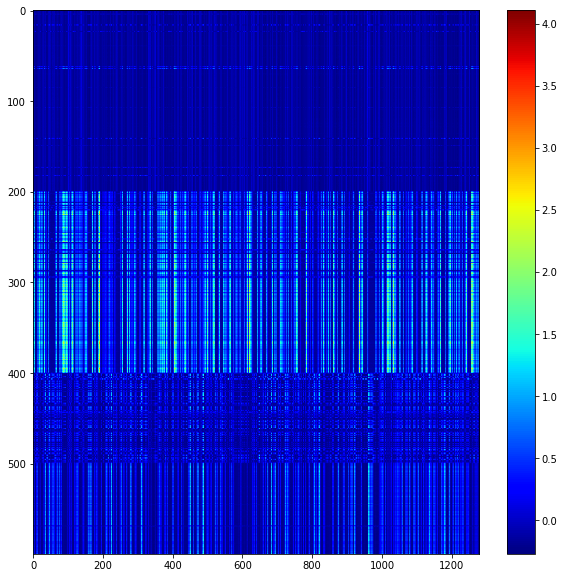

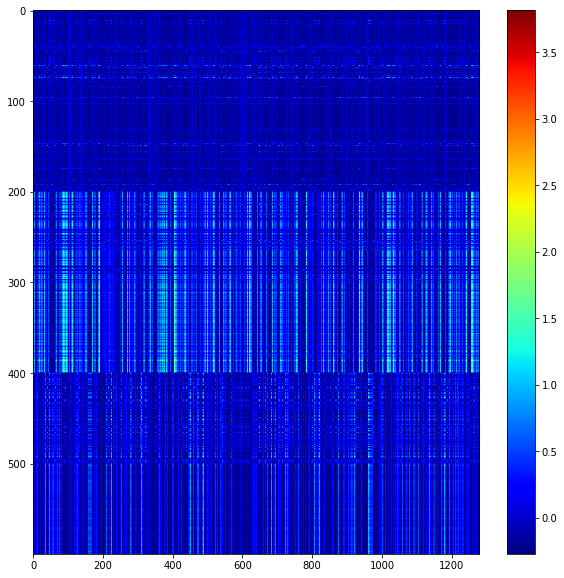

In [14]:
for phase in ['train','val_src', 'val_tgt']:
    plt.figure(figsize=(10,10))
    plt.imshow(feat[phase]['feature'].astype(float), aspect='auto', cmap='jet')
    plt.colorbar()
    plt.show()

# UMAP

In [15]:
from umap import UMAP

In [16]:
output_dicts = pd.read_pickle(f'{OUT_FEATURE_DIR}/{machine_types[0]}_features.pkl')

In [17]:
output_dicts

{'train': {'loss': 45.95155942440033,
  'feature': array([[-0.1863 , -0.171  , -0.1387 , ..., -0.1975 , -0.1062 ,  0.0088 ],
         [-0.1681 ,  1.96   , -0.1749 , ..., -0.1371 , -0.0343 , -0.1655 ],
         [-0.2188 , -0.1914 , -0.2551 , ..., -0.2554 , -0.01779, -0.2112 ],
         ...,
         [ 1.818  , -0.1969 ,  0.6455 , ..., -0.1896 , -0.09314,  1.285  ],
         [-0.1599 , -0.1724 , -0.0959 , ..., -0.187  ,  0.05017, -0.1343 ],
         [ 0.2607 ,  0.7646 ,  0.02701, ...,  0.3875 , -0.05133,  0.2517 ]],
        dtype=float16),
  'label': array([0, 0, 0, ..., 0, 0, 0]),
  'section_label': array([4, 1, 5, ..., 2, 0, 4]),
  'domain_label': array([0, 0, 0, ..., 0, 0, 0]),
  'wav_name': ['/media/hiroki/HDD1TB/research/dcase2021_task2/datasets/add_dev_data/fan/train/section_04_source_train_normal_0986_strength_1_ambient.wav',
   '/media/hiroki/HDD1TB/research/dcase2021_task2/datasets/dev_data/fan/train/section_01_source_train_normal_0168_strenght_1_big_ambient.wav',
   '/media/hir

# GMM

# train

In [194]:
output_dicts = pd.read_pickle(f'{OUT_FEATURE_DIR}/{machine_type}_features.pkl')
# umap
model = UMAP(random_state=42, n_components=100)
embedding_var_tr = model.fit_transform(output_dicts['train']['feature'])
embedding_var_val_src = model.fit_transform(output_dicts['val_src']['feature'])
embedding_var_val_tgt = model.fit_transform(output_dicts['val_tgt']['feature'])

In [195]:
per_sec_tr = []
sec_label = output_dicts['train']['section_label']
for section in range(6):
    sec_idx = np.where(sec_label == section)
    per_sec_tr.append(embedding_var_tr[sec_idx])

In [196]:
per_sec_src = []
sec_label = output_dicts['val_src']['section_label']
for section in range(6):
    sec_idx = np.where(sec_label == section)
    per_sec_src.append(embedding_var_val_src[sec_idx])

In [197]:
# per_sec_tgt = []
sec_label = output_dicts['val_tgt']['section_label']
for section in range(6):
    sec_idx = np.where(sec_label == section)
    per_sec_tgt.append(embedding_var_val_tgt[sec_idx])

In [198]:
per_sec_tr[0][:,0]

array([10.97698  , 10.961443 , 10.9698515, ..., 11.554237 , 11.559139 ,
       11.650586 ], dtype=float32)

In [199]:
from scipy.spatial.distance import cdist, pdist

In [159]:
cdist(per_sec_tr[0], per_sec_tr[1])

array([0.00436612, 0.00421321, 0.00592226, ..., 0.07232099, 3.57516466,
       3.55966434])

# n=100

In [201]:
for i in range(len(per_sec_tr)):
    print(i)
    print(cdist(per_sec_tr[0], per_sec_tr[i]).mean())

0
3.5301016030496855
1
14.925956525212909
2
14.449976415305958
3
14.964763291691838
4
14.655608804715992
5
15.032905626646192


In [202]:
for i in range(len(per_sec_tr)):
    print(i)
    print(cdist(per_sec_tr[0], per_sec_src[i]).mean())

0
14.988030141011732
1
18.14002600247316
2
18.90897238007246
3
nan
4
nan
5
nan


<ipython-input-202-6bb4f2a2faf2>:3: RuntimeWarning: Mean of empty slice.
  print(cdist(per_sec_tr[0], per_sec_src[i]).mean())
/home/hiroki/anaconda3/envs/dcase2021_task2/lib/python3.8/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [203]:
for i in range(len(per_sec_tr)):
    print(i)
    print(cdist(per_sec_tr[0], per_sec_tgt[i]).mean())

0


ValueError: XA and XB must have the same number of columns (i.e. feature dimension.)

# n=10

In [191]:
for i in range(len(per_sec_tr)):
    print(i)
    print(cdist(per_sec_tr[0], per_sec_tr[i], '').mean())

0
3.464285013366513
1
15.231663228698507
2
15.537146659307533
3
15.675650188871275
4
14.91611566348331
5
15.772683608298403


In [192]:
for i in range(len(per_sec_tr)):
    print(i)
    print(cdist(per_sec_tr[0], per_sec_src[i]).mean())

0
13.571939438677257
1
17.194397325759844
2
19.285766482785327
3
nan
4
nan
5
nan


<ipython-input-192-6bb4f2a2faf2>:3: RuntimeWarning: Mean of empty slice.
  print(cdist(per_sec_tr[0], per_sec_src[i]).mean())
/home/hiroki/anaconda3/envs/dcase2021_task2/lib/python3.8/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [193]:
for i in range(len(per_sec_tr)):
    print(i)
    print(cdist(per_sec_tr[0], per_sec_tgt[i]).mean())

0
16.985408489307567
1
9.633351408466423
2
15.44039606244175
3
nan
4
nan
5
nan


<ipython-input-193-c6c1e399718e>:3: RuntimeWarning: Mean of empty slice.
  print(cdist(per_sec_tr[0], per_sec_tgt[i]).mean())


# n=2

In [179]:
for i in range(len(per_sec_tr)):
    print(i)
    print(cdist(per_sec_tr[0], per_sec_tr[i]).mean())

0
3.744468931194056
1
10.39434652640774
2
12.24641274200378
3
25.716780602344603
4
16.41498280339245
5
22.398461526943112


In [180]:
for i in range(len(per_sec_tr)):
    print(i)
    print(cdist(per_sec_tr[0], per_sec_src[i]).mean())

0
8.41448159734482
1
18.953627417201982
2
20.128719390524555
3
nan
4
nan
5
nan


<ipython-input-180-6bb4f2a2faf2>:3: RuntimeWarning: Mean of empty slice.
  print(cdist(per_sec_tr[0], per_sec_src[i]).mean())
/home/hiroki/anaconda3/envs/dcase2021_task2/lib/python3.8/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [181]:
for i in range(len(per_sec_tr)):
    print(i)
    print(cdist(per_sec_tr[0], per_sec_tgt[i]).mean())

0
15.151693344348287
1
20.479084140893598
2
15.364088543213276
3
nan
4
nan
5
nan


<ipython-input-181-c6c1e399718e>:3: RuntimeWarning: Mean of empty slice.
  print(cdist(per_sec_tr[0], per_sec_tgt[i]).mean())


In [150]:
for i in range(len(per_sec_src)):
    print(i)
    print(cdist(per_sec_src[0], per_sec_src[i]).mean())

0
4.989927812625091
1
14.067930173574636
2
18.032046097582416
3
nan
4
nan
5
nan


<ipython-input-150-5a834b5138de>:3: RuntimeWarning: Mean of empty slice.
  print(cdist(per_sec_src[0], per_sec_src[i]).mean())
/home/hiroki/anaconda3/envs/dcase2021_task2/lib/python3.8/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


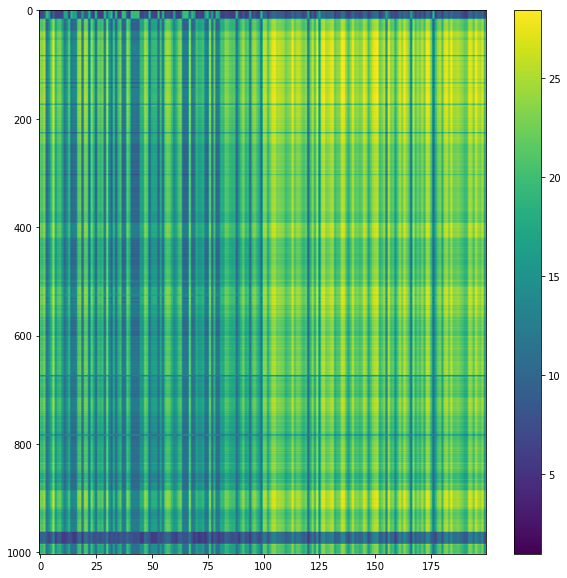

In [185]:
plt.figure(figsize=(10,10))
plt.imshow(cdist(per_sec_tr[0], per_sec_src[1]), aspect='auto')
plt.colorbar()

In [97]:
KLD(per_sec_src[0], per_sec_tgt[5])

<ipython-input-89-daef85023b62>:8: RuntimeWarning: divide by zero encountered in true_divide
  b_hist = (b_hist+epsilon)/np.sum(b_hist)
<ipython-input-89-daef85023b62>:11: RuntimeWarning: divide by zero encountered in log
  return np.sum([ai * np.log(ai / bi) for ai, bi in zip(a_hist, b_hist)])


-inf

In [82]:
per_sec_src

[]

In [56]:
np.where(sec_label == section)

(array([   2,    3,   17, ..., 5990, 5995, 6008]),)

In [49]:
embedding_var_tr

array([[18.793116 ,  4.25852  ],
       [ 9.085005 ,  3.7349734],
       [-1.8286705,  3.4222722],
       ...,
       [ 3.2796648, -4.664031 ],
       [18.259823 , -2.4694924],
       [18.714384 ,  4.2366567]], dtype=float32)

In [20]:
gmm = GaussianMixture(n_components=6, random_state=42)

In [21]:
gmm.fit(embedding_var)

GaussianMixture(n_components=6, random_state=42)

In [42]:
pd.DataFrame(gmm.predict(embedding_var)).value_counts()

1    1065
0    1028
3    1016
2    1006
5     952
4     951
dtype: int64

In [43]:
pd.DataFrame(gmm.predict(embedding_var_val_tgt)).value_counts()

3    216
0    197
4    165
1     22
dtype: int64

In [47]:
output_dicts['val_src']['section_label']

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [28]:
pred = gmm.predict(embedding_var_val_tgt)

In [30]:
pred = gmm.predict(embedding_var_val_src)
pred

array([3, 1, 3, 3, 4, 3, 3, 1, 3, 3, 3, 3, 4, 1, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 1, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 1,
       3, 1, 3, 3, 3, 3, 1, 3, 1, 3, 3, 3, 3, 3, 3, 3, 1, 3, 3, 1, 3, 3,
       3, 3, 3, 1, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 0, 3,
       3, 1, 0, 3, 3, 3, 3, 4, 4, 1, 0, 1, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 0, 0, 0, 1, 4, 0, 0, 3, 0, 0, 3, 1, 4, 0, 1, 1, 1, 0, 0, 1,
       0, 0, 1, 0, 3, 1, 0, 3, 0, 1, 0, 4, 1, 3, 1, 3, 0, 1, 1, 0, 0, 1,
       1, 1, 1, 3, 3, 0, 0, 1, 3, 3, 3, 1, 3, 1, 0, 0, 0, 3, 4, 3, 0, 0,
       1, 1, 1, 0, 1, 1, 3, 3, 3, 3, 1, 1, 0, 1, 0, 1, 1, 3, 3, 0, 0, 0,
       3, 3, 1, 3, 0, 0, 3, 0, 1, 0, 0, 0, 3, 1, 0,

In [29]:
pred = gmm.predict(embedding_var_val_tgt)
pred

array([0, 4, 4, 4, 0, 4, 4, 4, 4, 0, 4, 4, 4, 4, 4, 4, 0, 4, 0, 0, 4, 4,
       0, 4, 4, 0, 3, 4, 0, 4, 4, 4, 0, 4, 4, 4, 0, 3, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 3, 4, 4, 4, 4, 4, 4, 0, 0, 0, 0, 4, 0, 4, 0, 0, 4, 4, 3,
       4, 4, 0, 4, 0, 4, 4, 4, 4, 0, 4, 4, 0, 3, 0, 4, 4, 4, 4, 0, 4, 0,
       0, 4, 0, 0, 4, 3, 4, 4, 0, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 3, 0, 3, 3, 0, 0, 0, 0,
       3, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,

for machine_type in machine_types:
    output_dicts = pd.read_pickle(f'{OUT_FEATURE_DIR}/{machine_type}_features.pkl')
    # umap
    model = UMAP(random_state=42)
    embedding_var = model.fit_transform(output_dicts['train']['feature'])
    # 結果を二次元でプロットする
    fig = plt.figure(figsize=(10,10))
    secs = com.get_section_types(output_dicts['train']['wav_name'])
    label = output_dicts['train']['label']
    embedding_x = embedding_var[:, 0]
    embedding_y = embedding_var[:, 1]
    for sec in np.unique(secs):
        plt.scatter(embedding_x[secs == sec],
                    embedding_y[secs == sec],
                    label=f'sec={sec}')

    # グラフを表示する
    loss = output_dicts['train']['loss']
    plt.title(f'{machine_type}, loss = {loss}')
    plt.grid()
    plt.legend()
    plt.show()
    fig.savefig(f'./img/{machine_type}_train_embedding.png')

# train shift

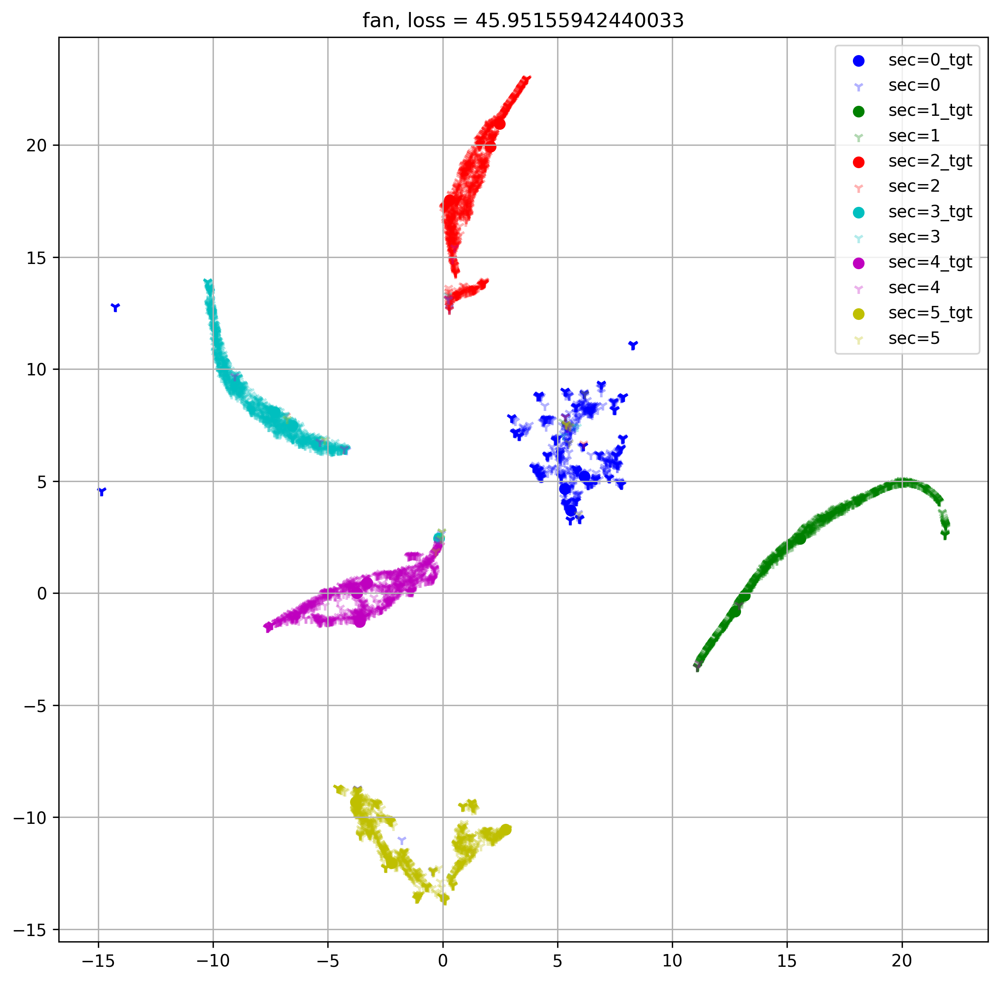

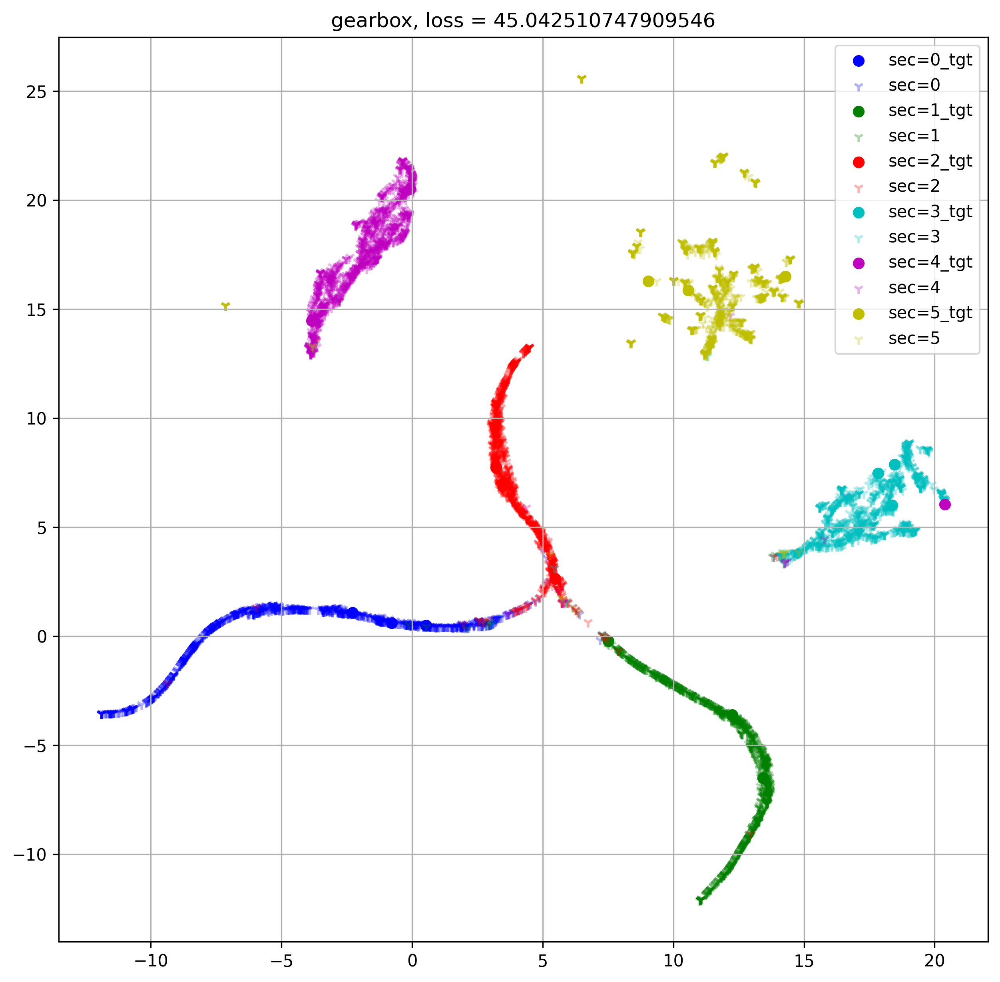

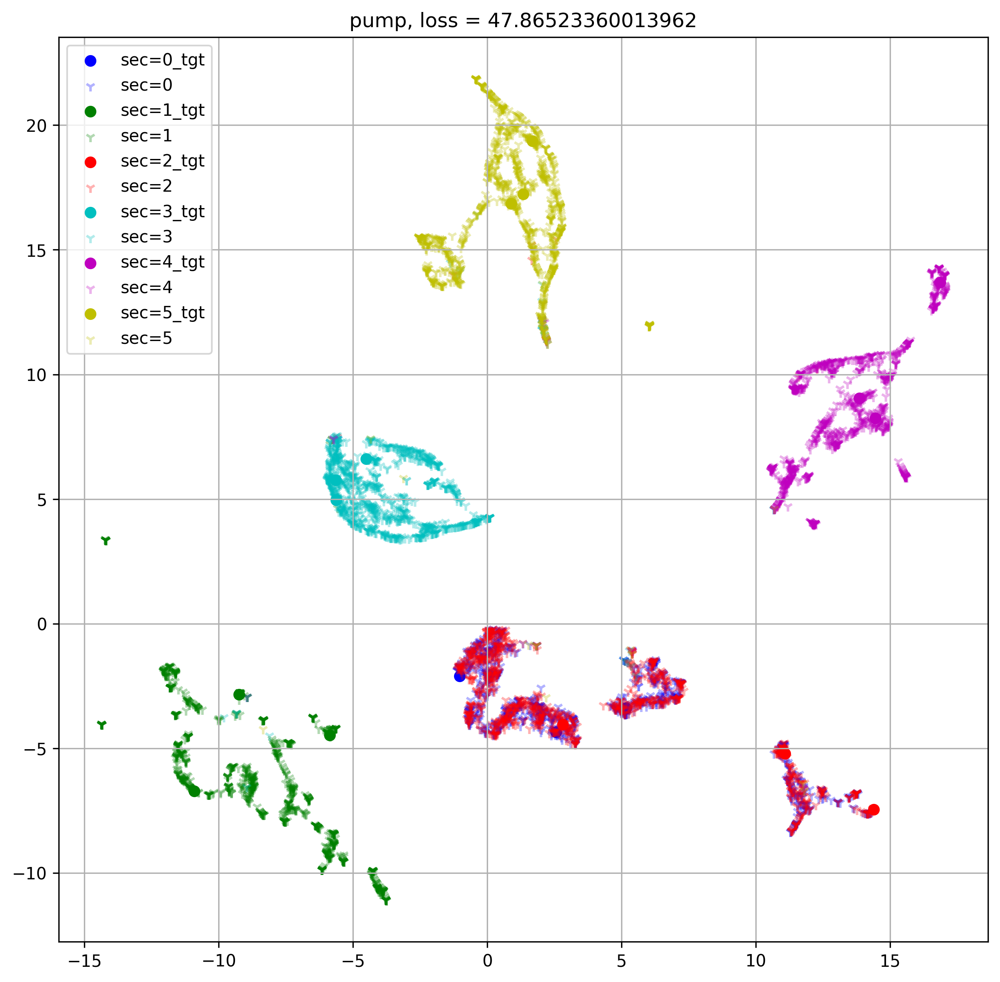

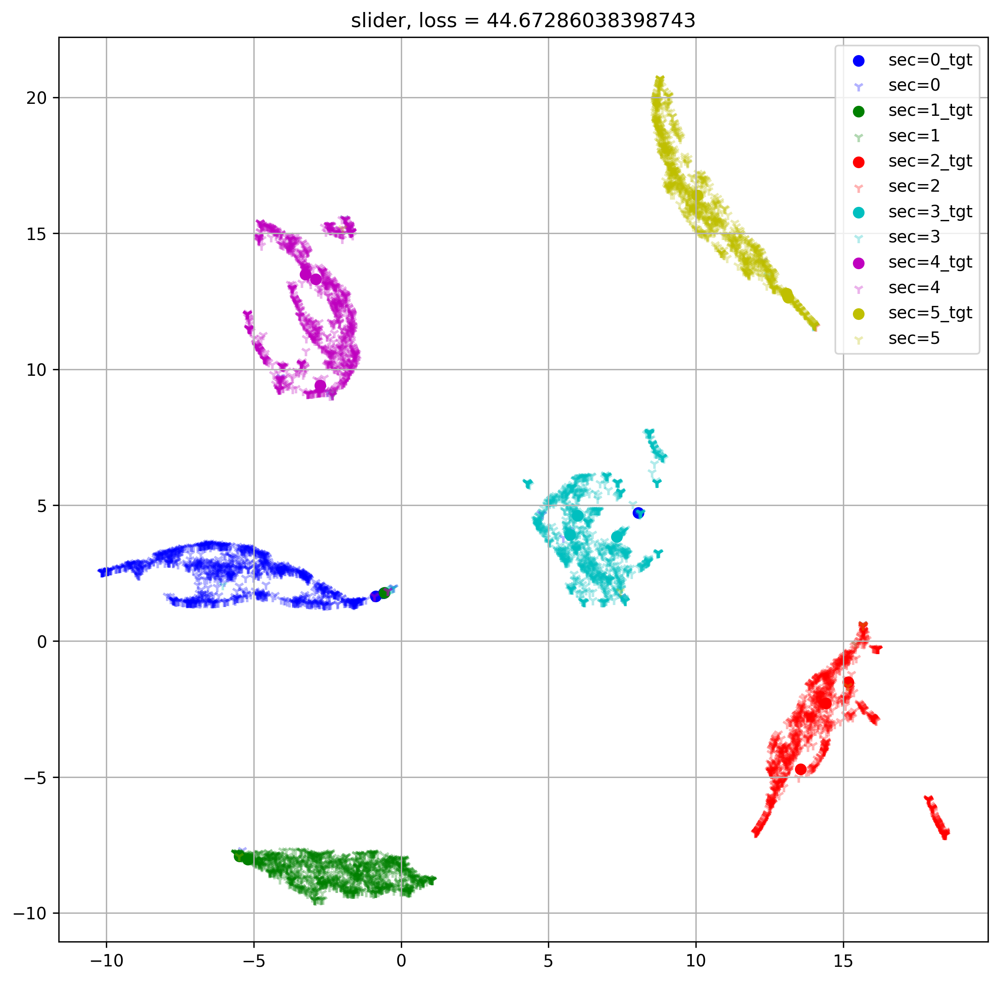

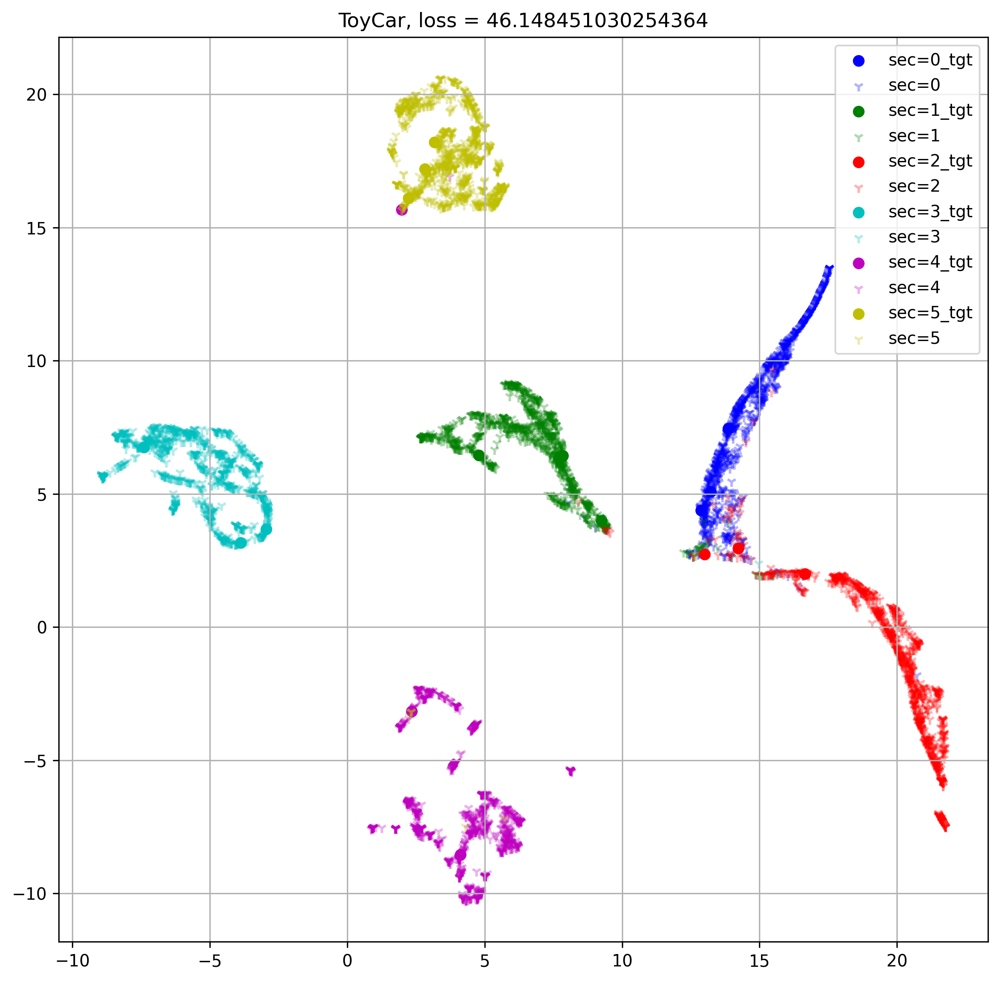

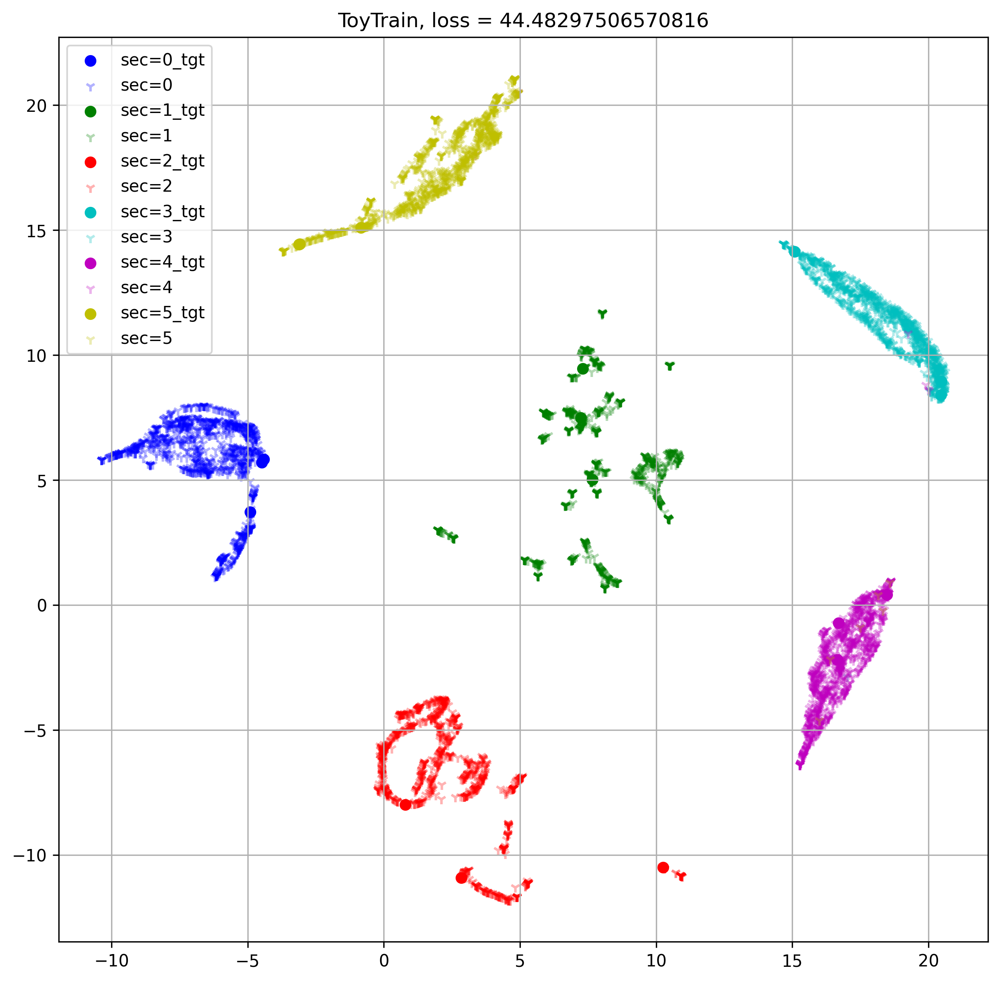

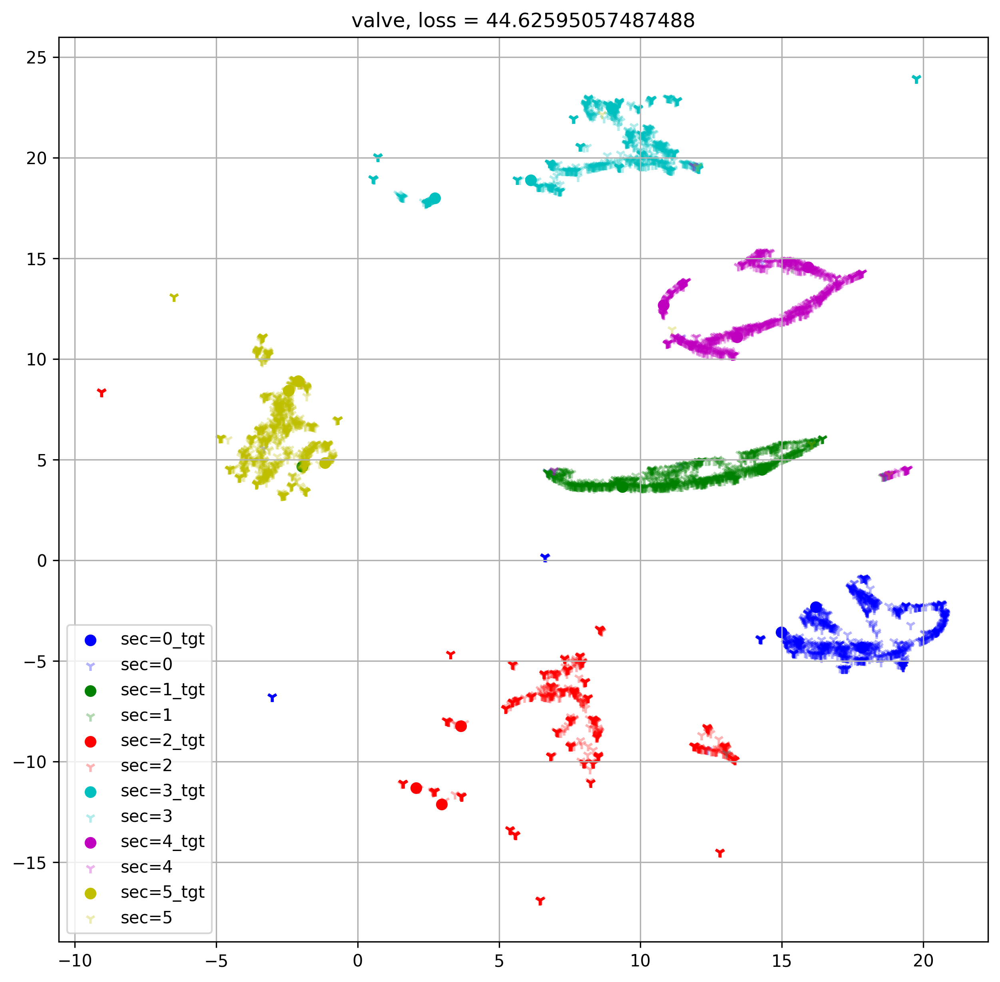

In [18]:
colors = ['b','g','r','c','m','y']
for machine_type in machine_types:
    output_dicts = pd.read_pickle(f'{OUT_FEATURE_DIR}/{machine_type}_features.pkl')
    # umap
    model = UMAP(random_state=42)
    embedding_var = model.fit_transform(output_dicts['train']['feature'])
    # 結果を二次元でプロットする
    fig = plt.figure(figsize=(10,10), dpi=300)
    secs = com.get_section_types(output_dicts['train']['wav_name'])
    # tgtのindexを取得
    tgt_idx = np.where(output_dicts['train']['domain_label'] == 1)[0]
    label = output_dicts['train']['label']
    embedding_x = embedding_var[:, 0]
    embedding_y = embedding_var[:, 1]
    
    for sec in np.unique(secs):
        # secのindexを抽出
        sec_idx = np.where(secs == sec)[0]
        # 積集合 (tgtかつhoge section)
        sec_tgt_idx = list(set(tgt_idx) & set(sec_idx))
        # tgt
        plt.scatter(embedding_x[sec_tgt_idx],
                    embedding_y[sec_tgt_idx],
                    label=f'sec={sec}_tgt',
                    c=colors[sec])
        # src
        # 差集合
        sec_src_idx = list(set(sec_idx) - set(sec_tgt_idx))
        plt.scatter(embedding_x[sec_src_idx],
                    embedding_y[sec_src_idx],
                    label=f'sec={sec}',
                    c=colors[sec],
                    alpha=0.3,
                    marker='1')#tri_down
        
    # グラフを表示する
    loss = output_dicts['train']['loss']
    plt.title(f'{machine_type}, loss = {loss}')
    plt.grid()
    plt.legend()
    plt.show()
    fig.savefig(f'./img/{machine_type}_train_shift_embedding.png')

# valid_src

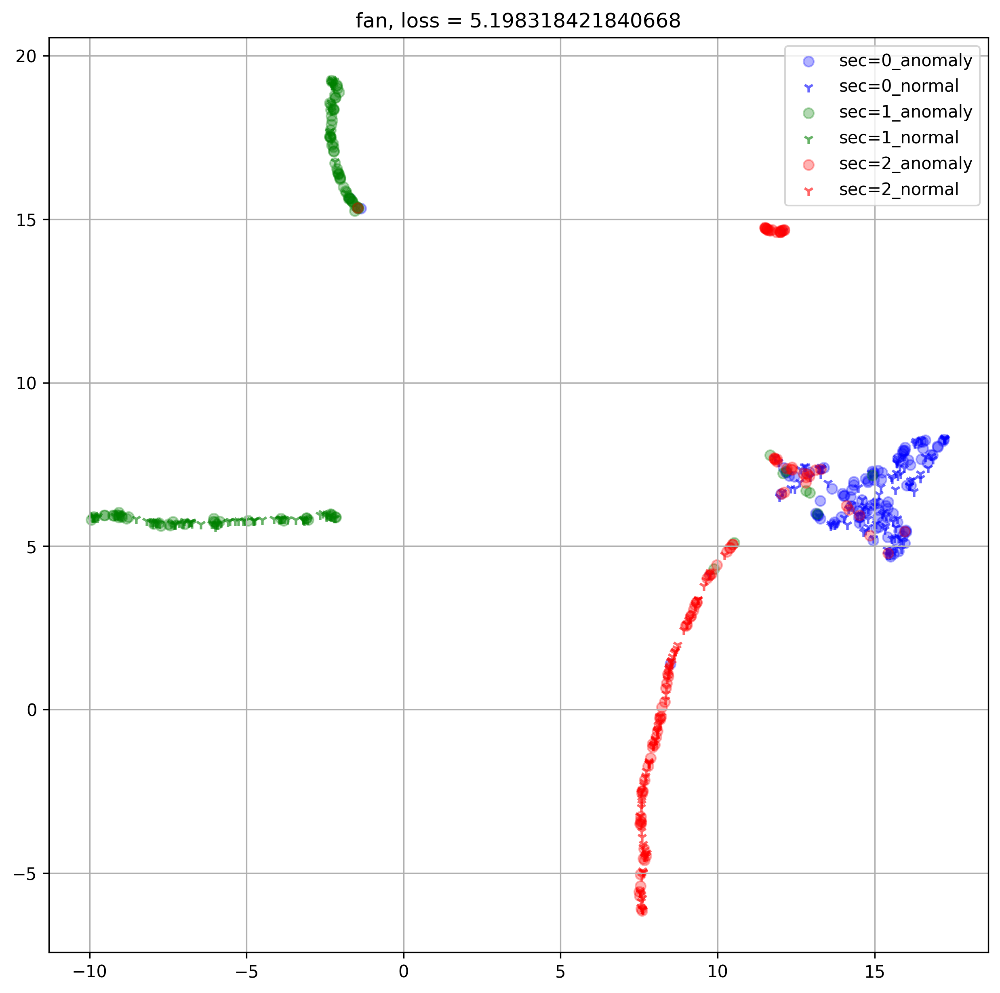

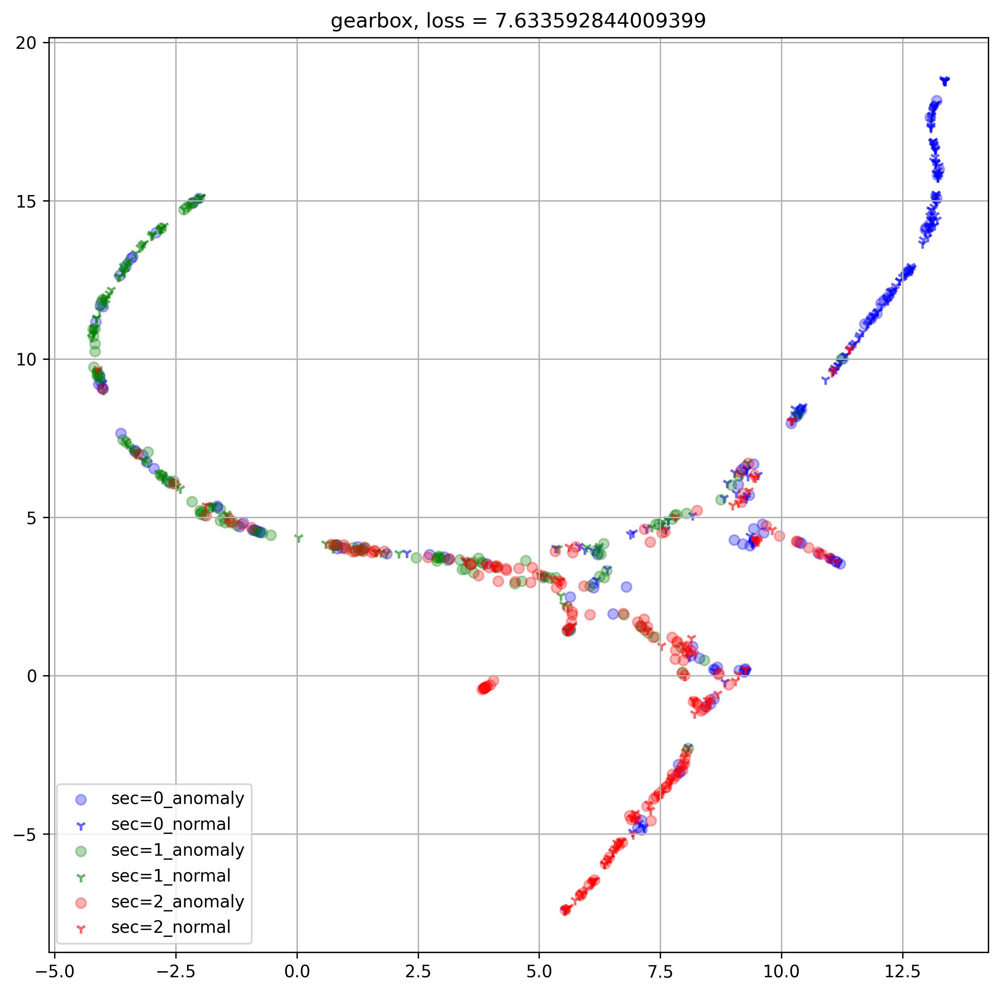

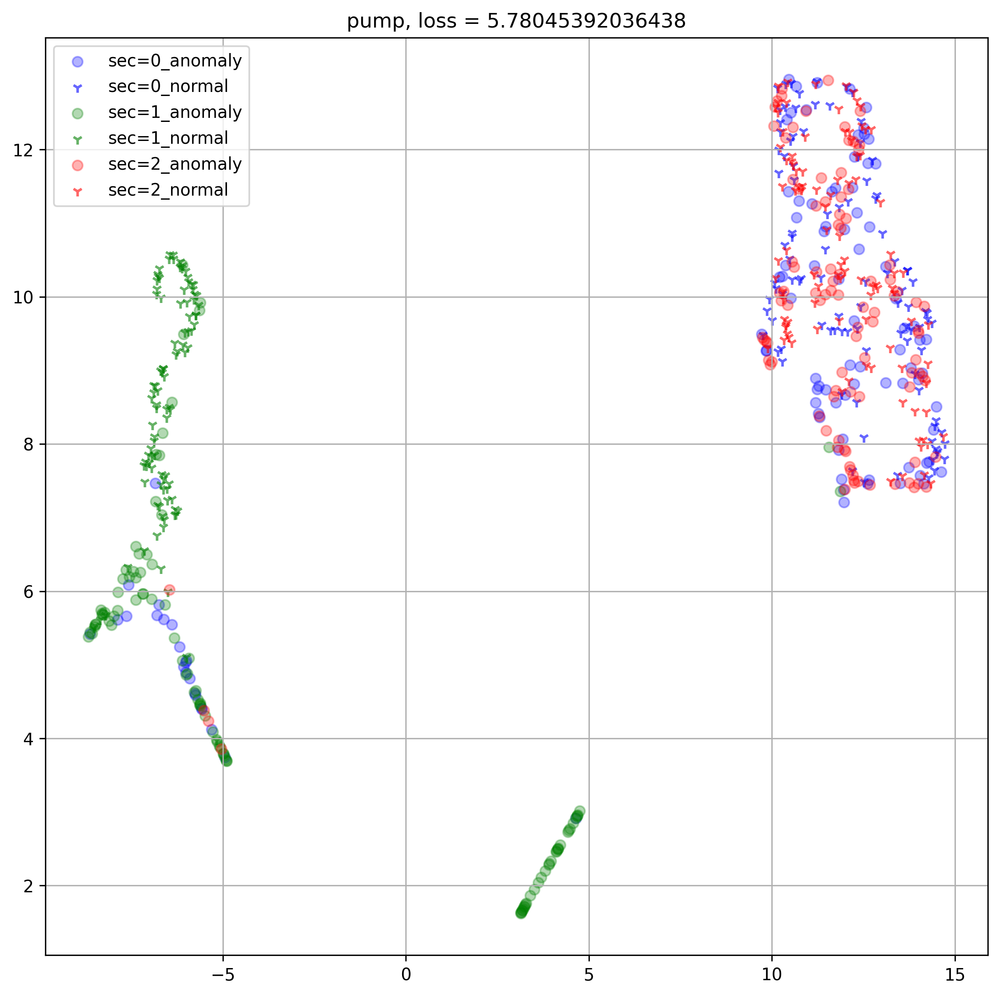

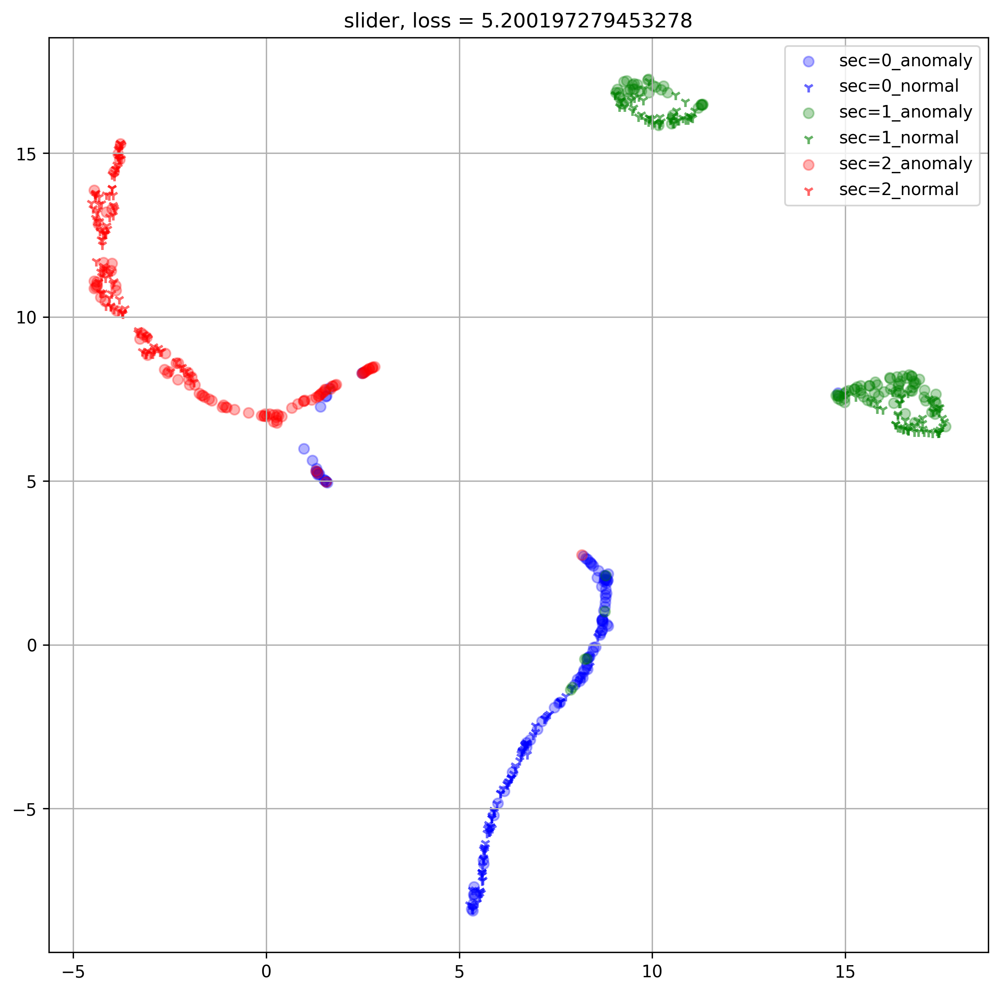

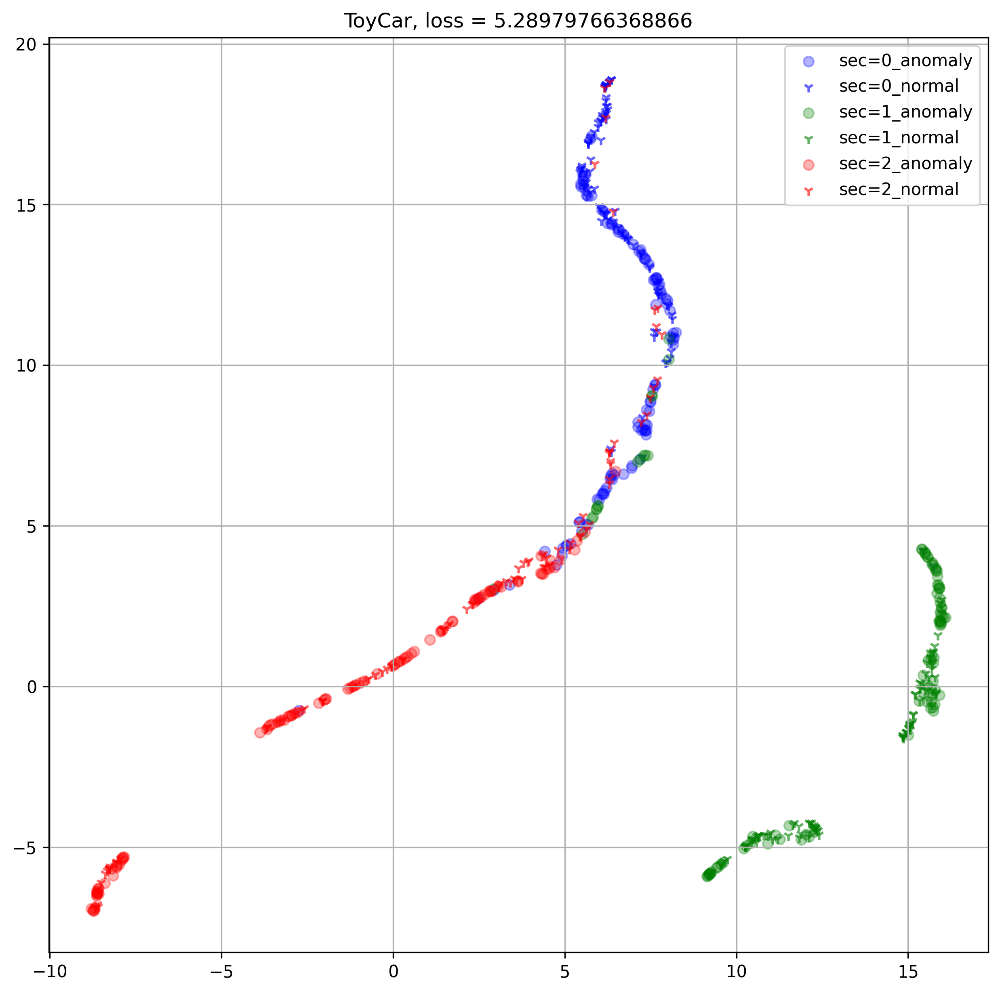

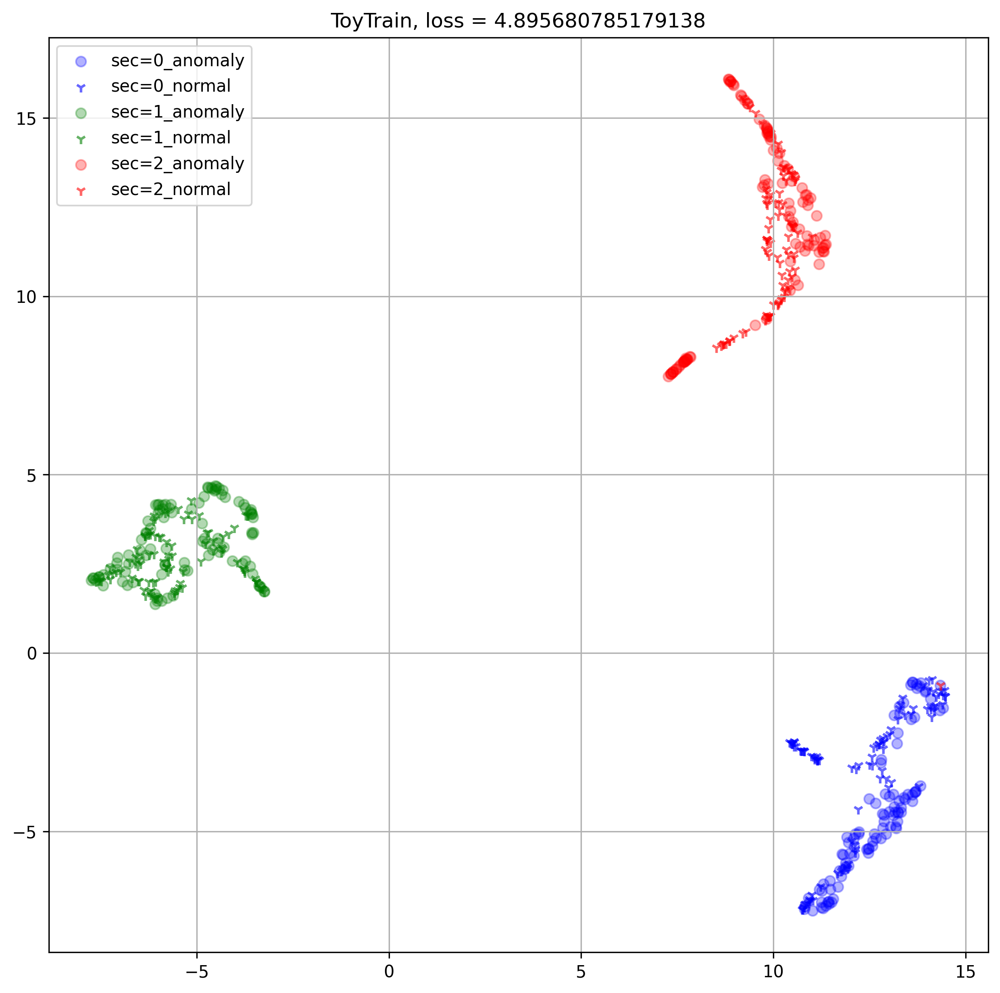

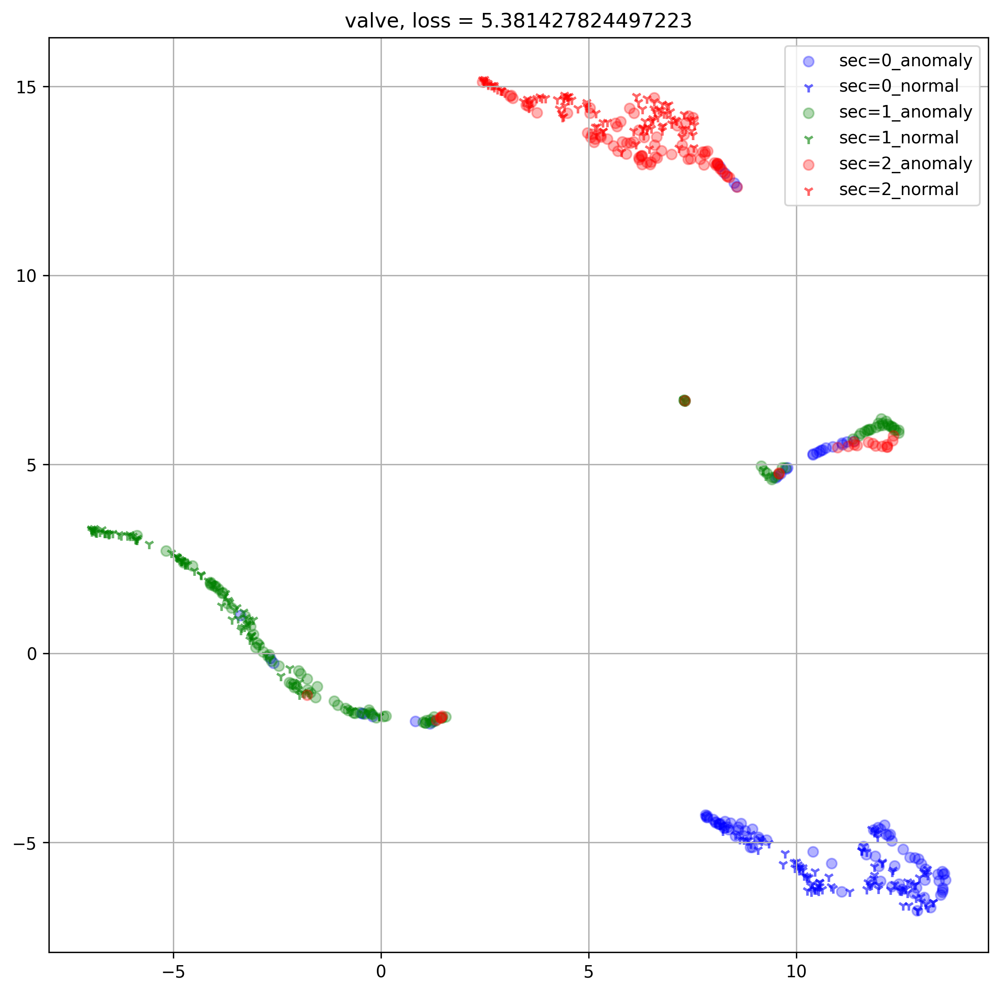

In [19]:
colors = ['b','g','r','c','m','y']
for machine_type in machine_types:
    output_dicts = pd.read_pickle(f'{OUT_FEATURE_DIR}/{machine_type}_features.pkl')
    # umap
    model = UMAP(random_state=42)
    embedding_var = model.fit_transform(output_dicts['val_src']['feature'])
    # 結果を二次元でプロットする
    fig = plt.figure(figsize=(10,10), dpi=300)
    secs = com.get_section_types(output_dicts['val_src']['wav_name'])
    # tgtのindexを取得
    tgt_idx = np.where(output_dicts['val_src']['domain_label'] == 1)[0]
    # anomalyのindexを取得
    label = output_dicts['val_src']['label']
    ano_idx = np.where(label == 1)[0]
    embedding_x = embedding_var[:, 0]
    embedding_y = embedding_var[:, 1]
    
    for sec in np.unique(secs):
        # secのindexを抽出
        sec_idx = np.where(secs == sec)[0]
        # 積集合 (tgtかつhoge section)
        sec_ano_idx = list(set(ano_idx) & set(sec_idx))
        # anomaly
        plt.scatter(embedding_x[sec_ano_idx],
                    embedding_y[sec_ano_idx],
                    label=f'sec={sec}_anomaly',
                    alpha=0.3,
                    c=colors[sec])
        # src
        # 差集合 (normal)
        sec_normal_idx = list(set(sec_idx) - set(sec_ano_idx))
        plt.scatter(embedding_x[sec_normal_idx],
                    embedding_y[sec_normal_idx],
                    label=f'sec={sec}_normal',
                    c=colors[sec],
                    alpha=0.6,
                    marker='1')#tri_down
        
    # グラフを表示する
    loss = output_dicts['val_src']['loss']
    plt.title(f'{machine_type}, loss = {loss}')
    plt.grid()
    plt.legend()
    plt.show()
    fig.savefig(f'./img/{machine_type}_valsrc_DeepRepresentation.png')

# valid_tgt

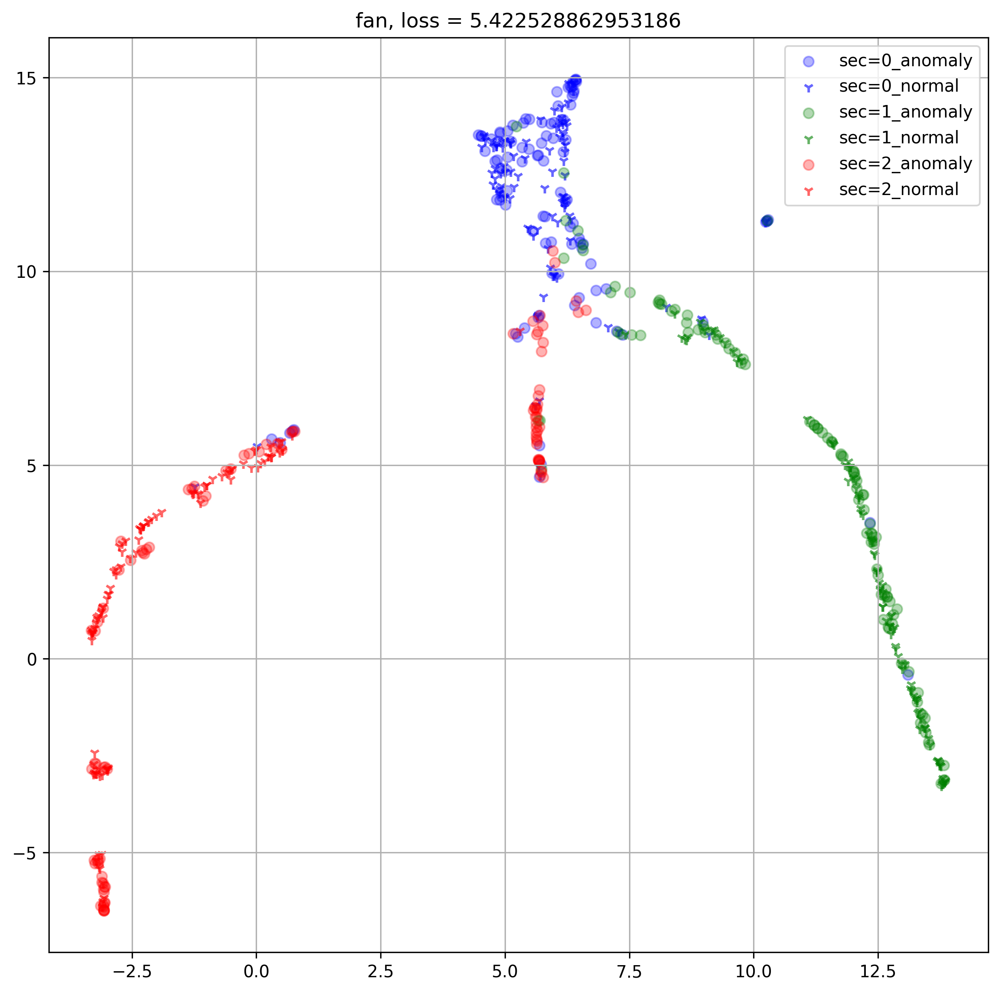

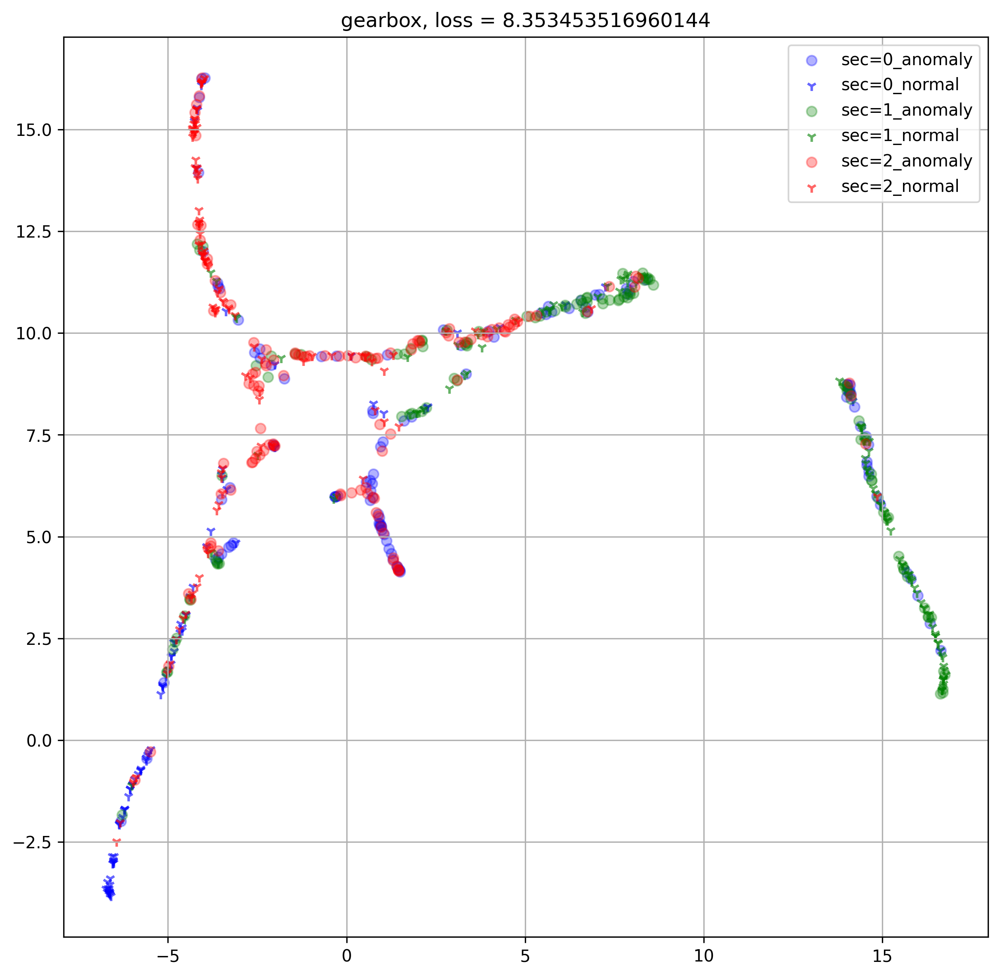

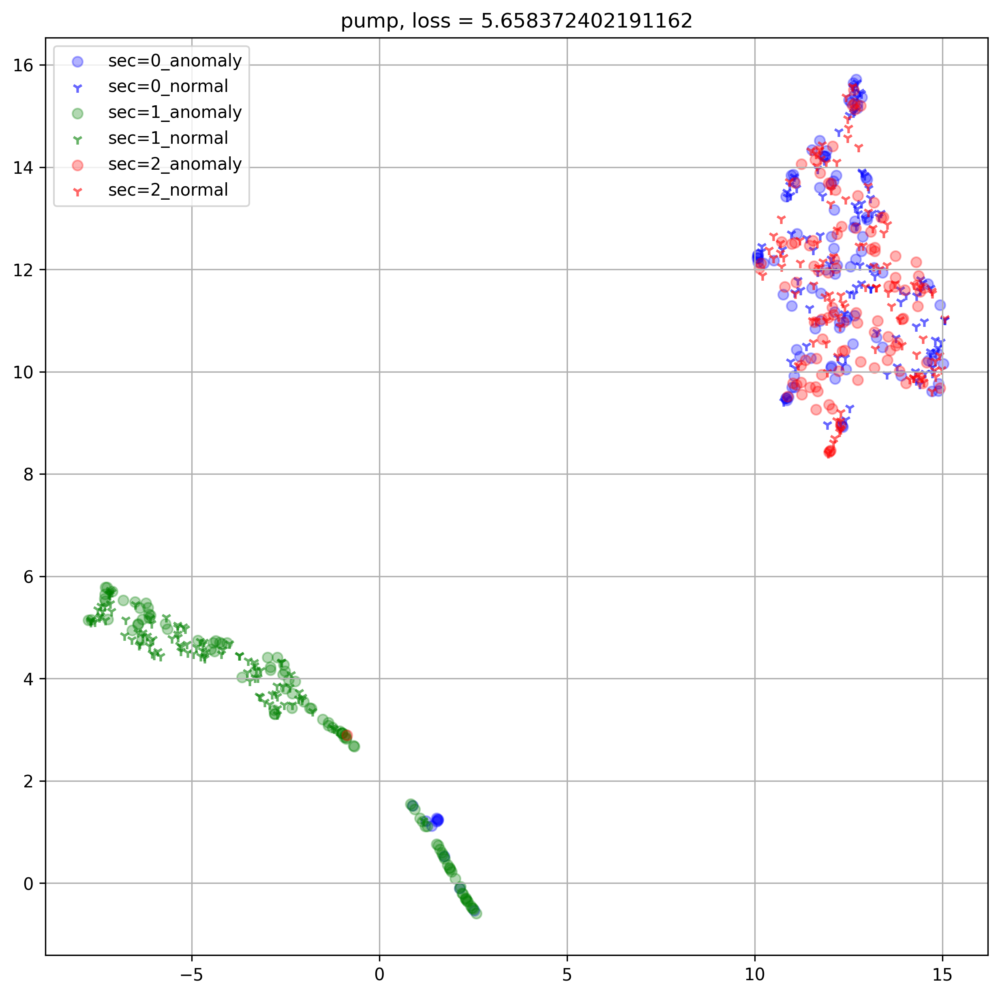

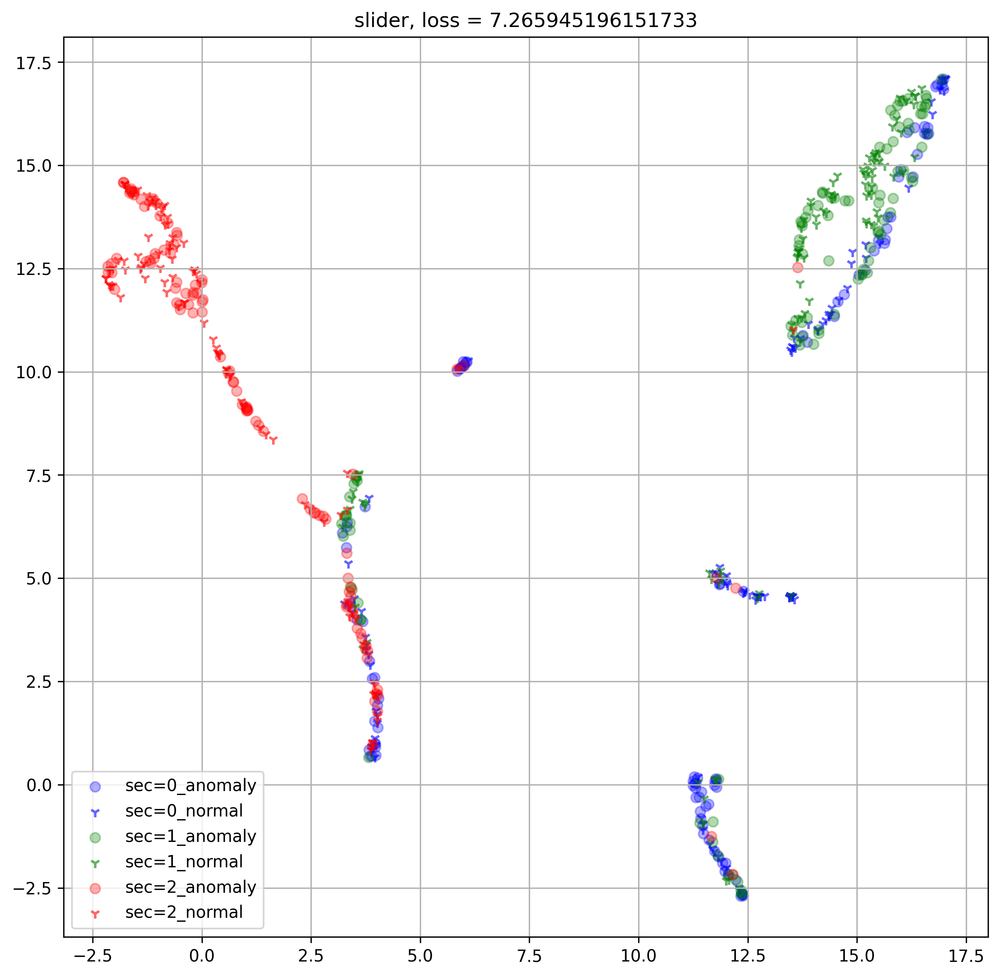

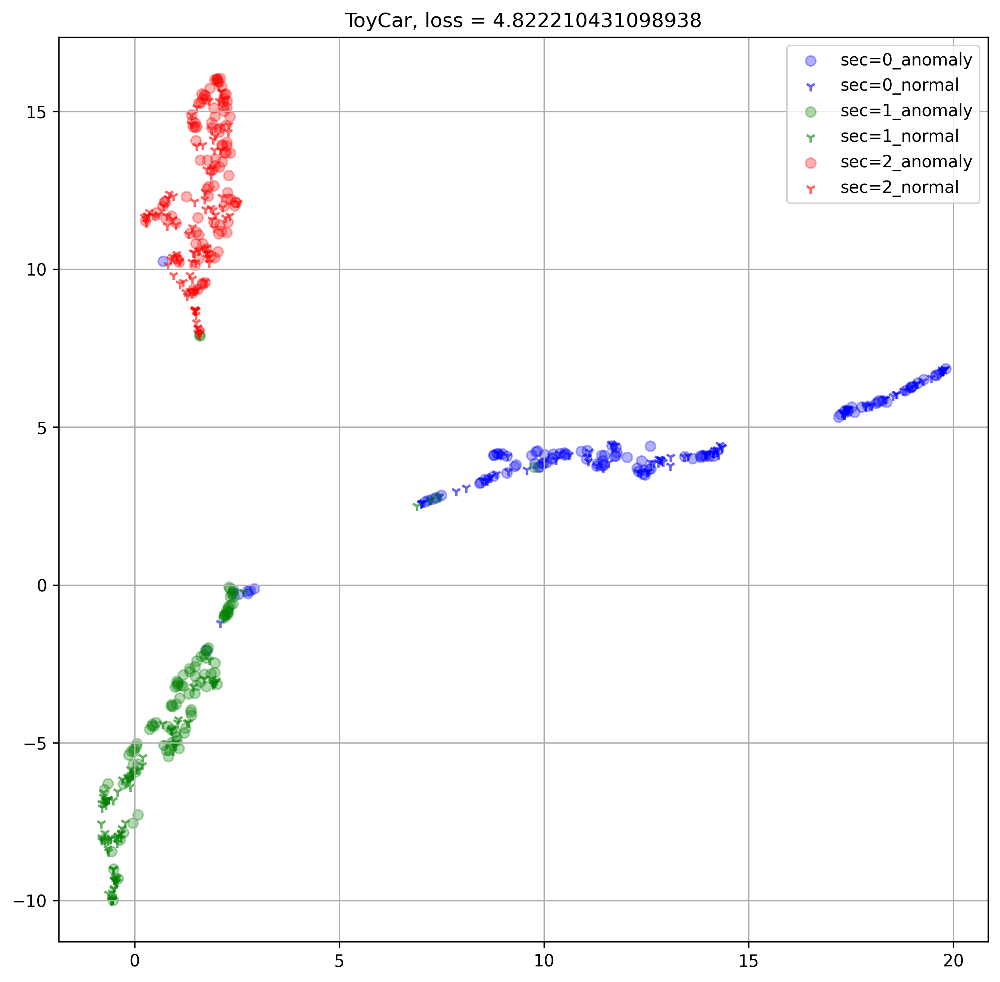

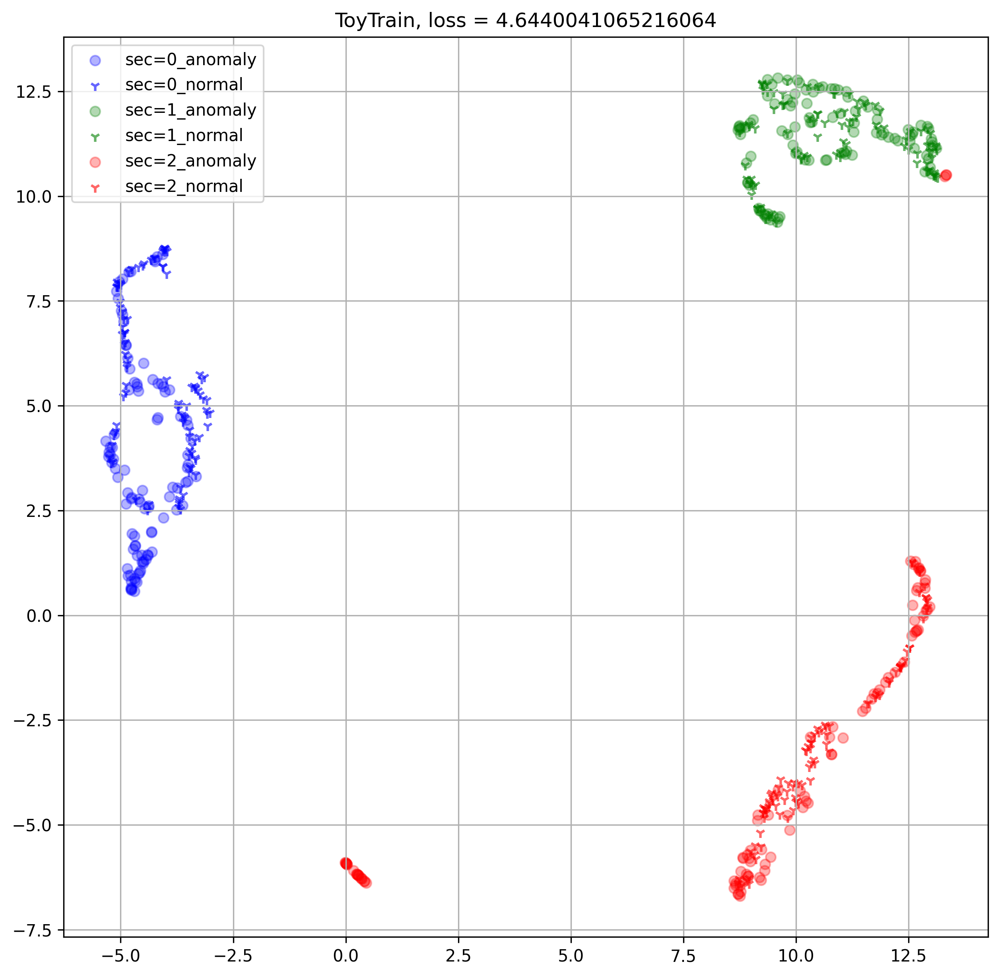

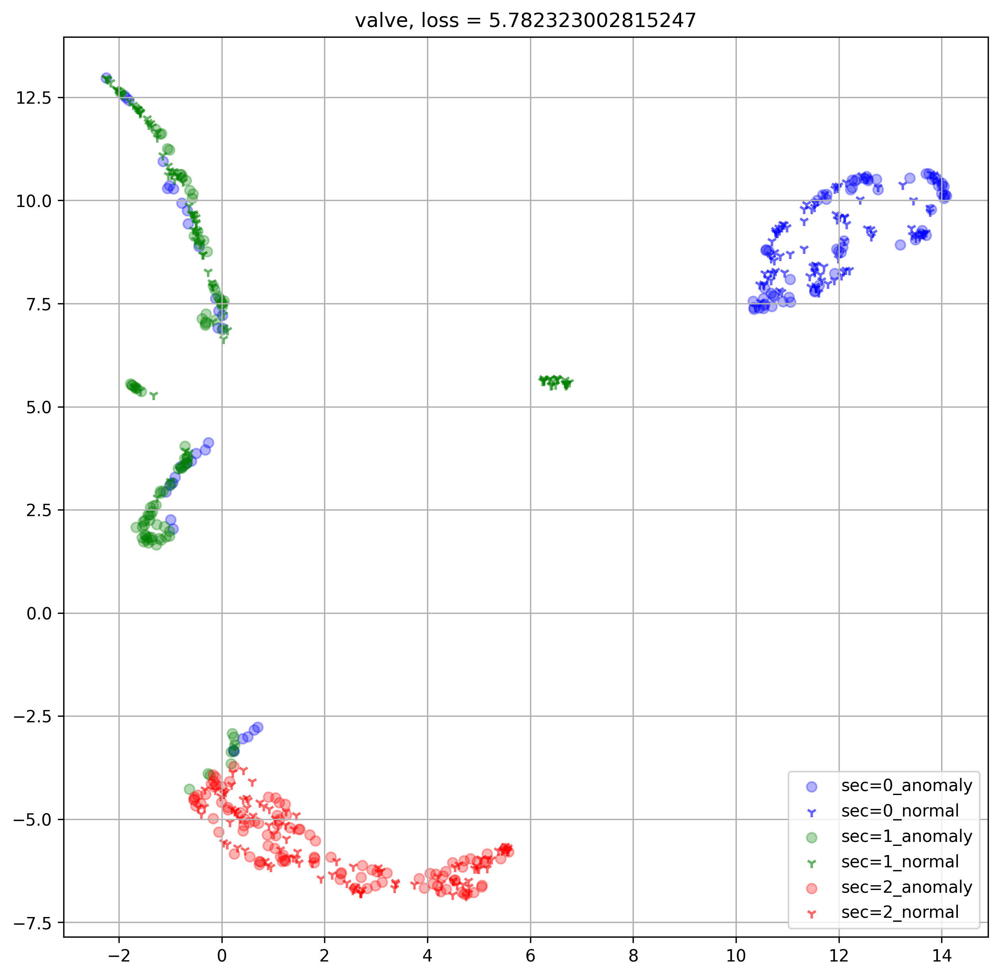

In [20]:
colors = ['b','g','r','c','m','y']
for machine_type in machine_types:
    output_dicts = pd.read_pickle(f'{OUT_FEATURE_DIR}/{machine_type}_features.pkl')
    # umap
    model = UMAP(random_state=42)
    embedding_var = model.fit_transform(output_dicts['val_tgt']['feature'])
    # 結果を二次元でプロットする
    fig = plt.figure(figsize=(10,10), dpi=300)
    secs = com.get_section_types(output_dicts['val_tgt']['wav_name'])
    # tgtのindexを取得
    tgt_idx = np.where(output_dicts['val_tgt']['domain_label'] == 1)[0]
    # anomalyのindexを取得
    label = output_dicts['val_tgt']['label']
    ano_idx = np.where(label == 1)[0]
    embedding_x = embedding_var[:, 0]
    embedding_y = embedding_var[:, 1]
    
    for sec in np.unique(secs):
        # secのindexを抽出
        sec_idx = np.where(secs == sec)[0]
        # 積集合 (tgtかつhoge section)
        sec_ano_idx = list(set(ano_idx) & set(sec_idx))
        # anomaly
        plt.scatter(embedding_x[sec_ano_idx],
                    embedding_y[sec_ano_idx],
                    label=f'sec={sec}_anomaly',
                    alpha=0.3,
                    c=colors[sec])
        # src
        # 差集合 (normal)
        sec_normal_idx = list(set(sec_idx) - set(sec_ano_idx))
        plt.scatter(embedding_x[sec_normal_idx],
                    embedding_y[sec_normal_idx],
                    label=f'sec={sec}_normal',
                    c=colors[sec],
                    alpha=0.6,
                    marker='1')#tri_down
        
    # グラフを表示する
    loss = output_dicts['val_tgt']['loss']
    plt.title(f'{machine_type}, loss = {loss}')
    plt.grid()
    plt.legend()
    plt.show()
    fig.savefig(f'./img/{machine_type}_valtgt_DeepRepresentation.png')